In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

# Create Dataframe

Database contains some type of skin disease : 
1. Eczema 1677 [Eczema Photos]
2. Melanoma 15.75k [Melanoma Skin Cancer Nevi and Moles]
3. Atopic Dermatitis - 1.25k [Atopic Dermatitis Photos]
4. Basal Cell Carcinoma (BCC) 3323
5. Melanocytic Nevi (NV) - 7970
6. Benign Keratosis-like Lesions (BKL) 2624
7. Psoriasis pictures Lichen Planus and related diseases - 2k [Psoriasis pictures Lichen Planus and related diseases]
8. Seborrheic Keratoses and other Benign Tumors - 1.8k [Seborrheic Keratoses and other Benign Tumors]
9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k [Tinea Ringworm Candidiasis and other Fungal Infections]
10. Warts Molluscum and other Viral Infections - 2103 [Warts Molluscum and other Viral Infections]
11. Acne and Rosacea Photos
12. Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
13. Bullous Disease Photos
14. Cellulitis Impetigo and other Bacterial Infections
15. Exanthems and Drug Eruptions
16. Hair Loss Photos Alopecia and other Hair Diseases
17. Herpes HPV and other STDs Photos
18. Light Diseases and Disorders of Pigmentation
19. Lupus and other Connective Tissue diseases
20. Nail Fungus and other Nail Disease
21. Poison Ivy Photos and other Contact Dermatitis
22. Scabies Lyme Disease and other Infestations and Bites
23. Systemic Disease
24. Urticaria Hives
25. Vascular Tumors
26. Vasculitis Photos

In [2]:
img_path = []
labels = []

for class_name in os.listdir('/kaggle/input/skin-diseases-image-dataset/IMG_CLASSES/'):
    for path in os.listdir("/kaggle/input/skin-diseases-image-dataset/IMG_CLASSES/" + class_name):
        if (class_name == "1. Eczema 1677"):
            labels.append(1)
        elif (class_name == "2. Melanoma 15.75k"):
            labels.append(2)
        elif (class_name == "3. Atopic Dermatitis - 1.25k"):
            labels.append(3)
        elif (class_name == "4. Basal Cell Carcinoma (BCC) 3323"):
            labels.append(4)
        elif (class_name == "5. Melanocytic Nevi (NV) - 7970"):
            labels.append(5)
        elif (class_name == "6. Benign Keratosis-like Lesions (BKL) 2624"):
            labels.append(6)
        elif (class_name == "7. Psoriasis pictures Lichen Planus and related diseases - 2k"):
            labels.append(7)
        elif (class_name == "8. Seborrheic Keratoses and other Benign Tumors - 1.8k"):
            labels.append(8)
        elif (class_name == "9. Tinea Ringworm Candidiasis and other Fungal Infections - 1.7k"):
            labels.append(9)
        else:
            labels.append(10)
        img_path.append(os.path.join("/kaggle/input/skin-diseases-image-dataset/IMG_CLASSES/", class_name, path))

In [3]:
for class_name in os.listdir('/kaggle/input/dermnet/train'):
    for path in os.listdir('/kaggle/input/dermnet/train/' + class_name):
        if (class_name == "Eczema Photos"):
            labels.append(1)
        elif (class_name == "Melanoma Skin Cancer Nevi and Moles"):
            labels.append(2)
        elif (class_name == "Atopic Dermatitis Photos"):
            labels.append(3)
        elif (class_name == "Psoriasis pictures Lichen Planus and related diseases"):
            labels.append(7)
        elif (class_name == "Seborrheic Keratoses and other Benign Tumors"):
            labels.append(8)
        elif (class_name == "Tinea Ringworm Candidiasis and other Fungal Infections"):
            labels.append(9)
        elif (class_name == "Warts Molluscum and other Viral Infections"):
            labels.append(10)
        elif class_name == "Acne and Rosacea Photos":
            labels.append(11)
        elif class_name == "Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions":
            labels.append(12)
        elif class_name == "Bullous Disease Photos":
            labels.append(13)
        elif class_name == "Cellulitis Impetigo and other Bacterial Infections":
            labels.append(14)
        elif class_name == "Exanthems and Drug Eruptions":
            labels.append(15)
        elif class_name == "Hair Loss Photos Alopecia and other Hair Diseases":
            labels.append(16)
        elif class_name == "Herpes HPV and other STDs Photos":
            labels.append(17)
        elif class_name == "Light Diseases and Disorders of Pigmentation":
            labels.append(18)
        elif class_name == "Lupus and other Connective Tissue diseases":
            labels.append(19)
        elif class_name == "Nail Fungus and other Nail Disease":
            labels.append(20)
        elif class_name == "Poison Ivy Photos and other Contact Dermatitis":
            labels.append(21)
        elif class_name == "Scabies Lyme Disease and other Infestations and Bites":
            labels.append(22)
        elif class_name == "Systemic Disease":
            labels.append(23)
        elif class_name == "Urticaria Hives":
            labels.append(24)
        elif class_name == "Vascular Tumors":
            labels.append(25)
        else:
            labels.append(26)
        img_path.append(os.path.join("kaggle/input/dermnet/train", class_name, path))

In [4]:
# for class_name in os.listdir('/kaggle/input/dermnet/test'):
#     for path in os.listdir('/kaggle/input/dermnet/test/' + class_name):
#         if (class_name == "Eczema Photos"):
#             labels.append(1)
#         elif (class_name == "Melanoma Skin Cancer Nevi and Moles"):
#             labels.append(2)
#         elif (class_name == "Atopic Dermatitis Photos"):
#             labels.append(3)
#         elif (class_name == "Psoriasis pictures Lichen Planus and related diseases"):
#             labels.append(7)
#         elif (class_name == "Seborrheic Keratoses and other Benign Tumors"):
#             labels.append(8)
#         elif (class_name == "Tinea Ringworm Candidiasis and other Fungal Infections"):
#             labels.append(9)
#         elif (class_name == "Warts Molluscum and other Viral Infections"):
#             labels.append(10)
#         elif class_name == "Acne and Rosacea Photos":
#             labels.append(11)
#         elif class_name == "Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions":
#             labels.append(12)
#         elif class_name == "Bullous Disease Photos":
#             labels.append(13)
#         elif class_name == "Cellulitis Impetigo and other Bacterial Infections":
#             labels.append(14)
#         elif class_name == "Exanthems and Drug Eruptions":
#             labels.append(15)
#         elif class_name == "Hair Loss Photos Alopecia and other Hair Diseases":
#             labels.append(16)
#         elif class_name == "Herpes HPV and other STDs Photos":
#             labels.append(17)
#         elif class_name == "Light Diseases and Disorders of Pigmentation":
#             labels.append(18)
#         elif class_name == "Lupus and other Connective Tissue diseases":
#             labels.append(19)
#         elif class_name == "Nail Fungus and other Nail Disease":
#             labels.append(20)
#         elif class_name == "Poison Ivy Photos and other Contact Dermatitis":
#             labels.append(21)
#         elif class_name == "Scabies Lyme Disease and other Infestations and Bites":
#             labels.append(22)
#         elif class_name == "Systemic Disease":
#             labels.append(23)
#         elif class_name == "Urticaria Hives":
#             labels.append(24)
#         elif class_name == "Vascular Tumors":
#             labels.append(25)
#         else:
#             labels.append(26)
#         img_path.append(os.path.join("kaggle/input/dermnet/test", class_name, path))

In [5]:
df = pd.DataFrame()
df['img'] = img_path
df['label'] = labels
df.head()

,img,label
0,/kaggle/input/skin-diseases-image-dataset/IMG_...,1
1,/kaggle/input/skin-diseases-image-dataset/IMG_...,1
2,/kaggle/input/skin-diseases-image-dataset/IMG_...,1
3,/kaggle/input/skin-diseases-image-dataset/IMG_...,1
4,/kaggle/input/skin-diseases-image-dataset/IMG_...,1


# Exploratory Data Analysis

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42710 entries, 0 to 42709
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   img     42710 non-null  object
 1   label   42710 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 667.5+ KB


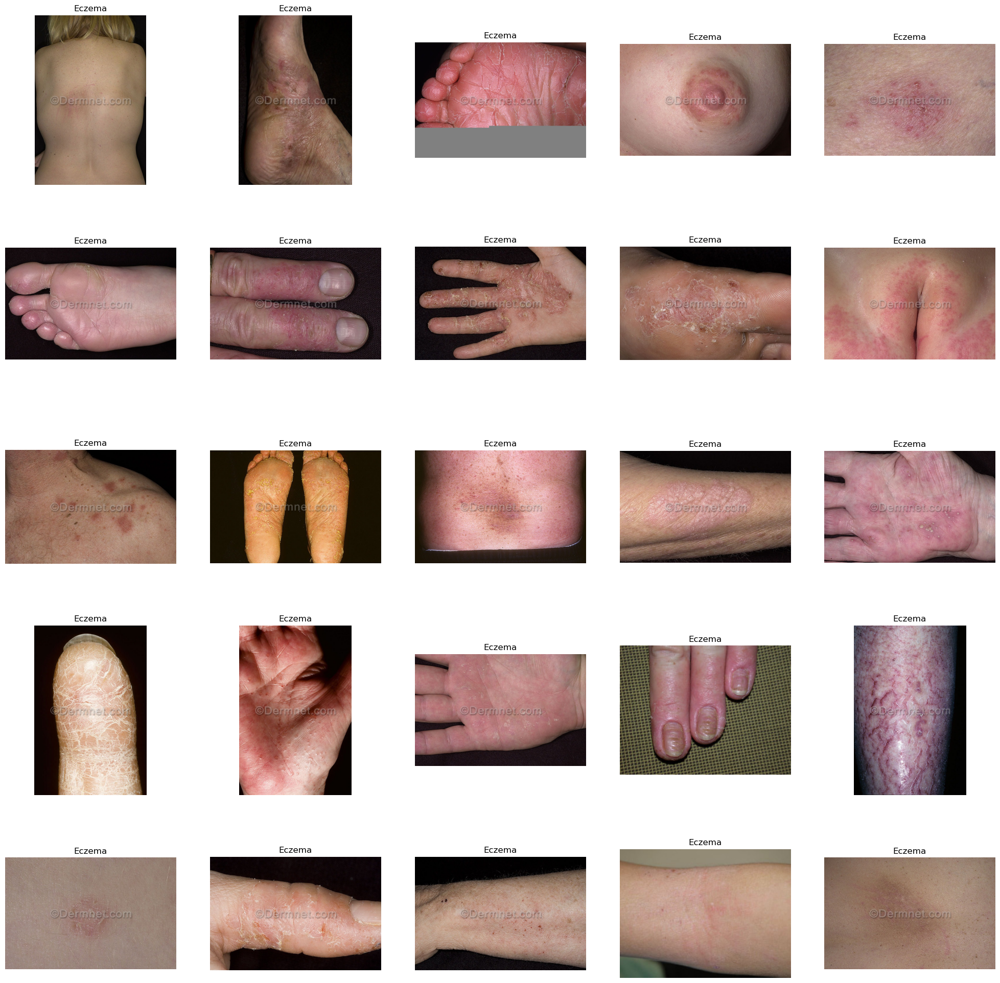

In [7]:
import random
import math

plt.figure(figsize=(25,25))
temp = df[df['label'] == 1]['img']
start = random.randint(0, len(temp))
files = temp[start:start+25]  

num_files = len(files)
num_rows = math.ceil(math.sqrt(num_files))
num_cols = math.ceil(num_files / num_rows)

for i, file in enumerate(files):
    plt.subplot(num_rows, num_cols, i+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title("Eczema")
    plt.axis('off')

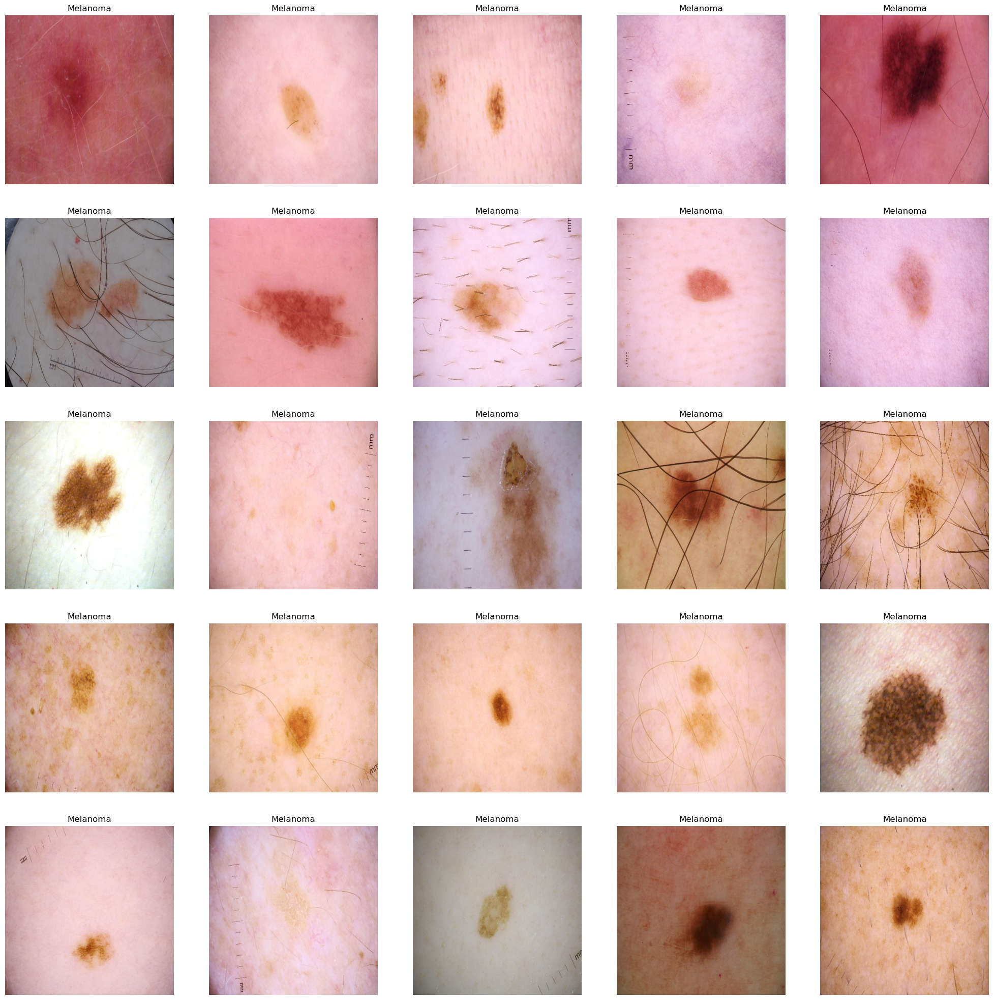

In [8]:
plt.figure(figsize=(25,25))
temp = df[df['label'] == 2]['img']
start = random.randint(0, len(temp))
files = temp[start:start+25]  

num_files = len(files)
num_rows = math.ceil(math.sqrt(num_files))
num_cols = math.ceil(num_files / num_rows)

for i, file in enumerate(files):
    plt.subplot(num_rows, num_cols, i+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title("Melanoma")
    plt.axis('off')

In [9]:
df.nunique()

img      42710
label       26
dtype: int64

<Axes: >

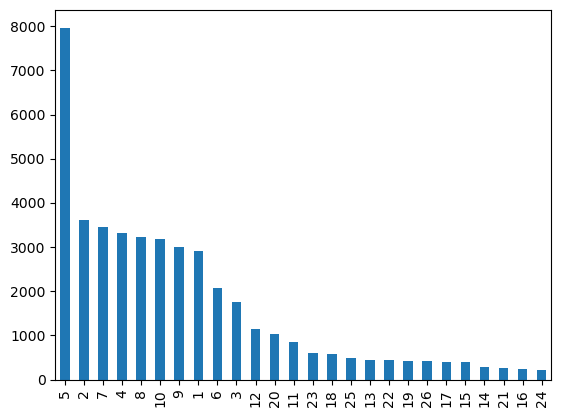

In [10]:
plot_df = df.label.value_counts()
plot_df.plot(kind="bar")

# Data Generator

### Split train and test

In [11]:
df['label'] = df['label'].astype('str')

In [12]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

In [13]:
from keras.preprocessing.image import ImageDataGenerator

train_gen = ImageDataGenerator(
    rescale = 1./255, # Norm image
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)
test_gen = ImageDataGenerator(
    rescale = 1./255, # Norm image
)
train_iterator = train_gen.flow_from_dataframe(
    train, 
    x_col='img', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
)
test_iterator = test_gen.flow_from_dataframe(
    test, 
    x_col='img', 
    y_col='label', 
    target_size=(128,128), 
    batch_size=512, 
)

Found 21733 validated image filenames belonging to 10 classes.
Found 5420 validated image filenames belonging to 10 classes.


# Build Model

In [14]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
num_classes = 10

model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(num_classes, activation='softmax')
])

In [15]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [16]:
history = model.fit(train_iterator, epochs=10, validation_data=test_iterator)

Epoch 1/10
43/43 [==============================] - 423s 10s/step - loss: 0.2878 - accuracy: 0.3448 - val_loss: 0.2316 - val_accuracy: 0.4579
Epoch 2/10
43/43 [==============================] - 256s 6s/step - loss: 0.2211 - accuracy: 0.4819 - val_loss: 0.2085 - val_accuracy: 0.5208
Epoch 3/10
43/43 [==============================] - 251s 6s/step - loss: 0.2026 - accuracy: 0.5317 - val_loss: 0.1993 - val_accuracy: 0.5410
Epoch 4/10
43/43 [==============================] - 261s 6s/step - loss: 0.1947 - accuracy: 0.5512 - val_loss: 0.1903 - val_accuracy: 0.5677
Epoch 5/10
43/43 [==============================] - 316s 7s/step - loss: 0.1855 - accuracy: 0.5721 - val_loss: 0.1852 - val_accuracy: 0.5697
Epoch 6/10
43/43 [==============================] - 270s 6s/step - loss: 0.1775 - accuracy: 0.5941 - val_loss: 0.1920 - val_accuracy: 0.5565
Epoch 7/10
43/43 [==============================] - 238s 6s/step - loss: 0.1758 - accuracy: 0.5974 - val_loss: 0.1771 - val_accuracy: 0.5845
Epoch 8/10
4

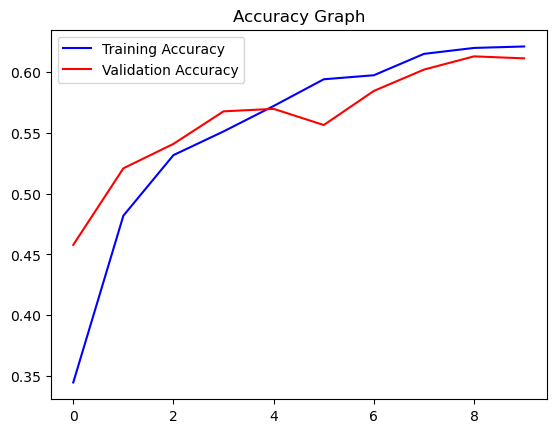

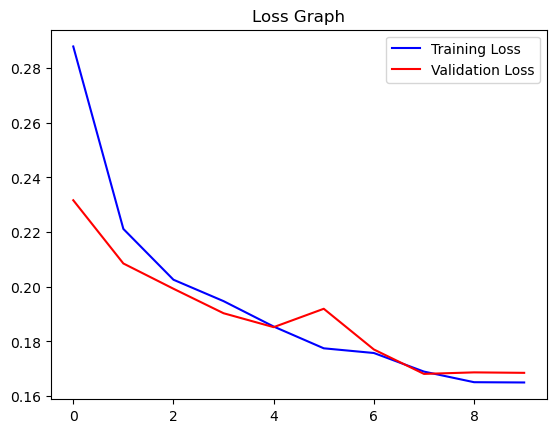

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()